In [1]:
%%shell
DATASET_NAMES=("maps" "cityscapes" "facades" "night2day" "edges2shoes" "edges2handbags")
BASE_URL='http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/'

for name in ${DATASET_NAMES[@]}; do
  file_name="${name}.tar.gz"
  if [ ! -d "$name" ]; then
      if [ ! -f "$file_name" ]; then
          wget "${BASE_URL}${file_name}"
          cp "${file_name}" /content/drive/MyDrive/
      fi
      tar -xvzf $file_name
      rm $file_name
  fi
done


In [2]:
%%shell
DATASET_NAMES=("maps" "cityscapes" "facades" "night2day" "edges2shoes" "edges2handbags")

for name in ${DATASET_NAMES[@]}; do
    cp -r /content/drive/MyDrive/"${name}" ./
done


In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [4]:
def make_discriminator_model(input_shape=(256, 256, 3)):
  init = tf.keras.initializers.RandomNormal(stddev=0.02)

  src_image_input = tf.keras.Input(input_shape)
  real_image_input = tf.keras.Input(input_shape)
  
  merge_inputs = tf.keras.layers.Concatenate()([src_image_input, 
                                                real_image_input])
  # C64
  d = tf.keras.layers.Conv2D(64, (4,4), strides=(2,2), padding='same', 
                             kernel_initializer=init)(merge_inputs)
  d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)
  
  # C128
  d = tf.keras.layers.Conv2D(128, (4,4), strides=(2,2), padding='same', 
                             kernel_initializer=init)(d)
  d = tf.keras.layers.BatchNormalization()(d)
  d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)

  # C256
  d = tf.keras.layers.Conv2D(256, (4,4), strides=(2,2), padding='same', 
                             kernel_initializer=init)(d)
  d = tf.keras.layers.BatchNormalization()(d)
  d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)

  # C512
  d = tf.keras.layers.Conv2D(512, (4,4), strides=(2,2), padding='same', 
                             kernel_initializer=init)(d)
  d = tf.keras.layers.BatchNormalization()(d)
  d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)

  # second last output layer
  d = tf.keras.layers.Conv2D(512, (4,4), padding='same', 
                             kernel_initializer=init)(d)
  d = tf.keras.layers.BatchNormalization()(d)
  d = tf.keras.layers.LeakyReLU(alpha=0.2)(d)

  # patch output
  d = tf.keras.layers.Conv2D(1, (4,4), padding='same', 
                             kernel_initializer=init)(d)
  patch_out = tf.keras.layers.Activation('sigmoid')(d)

  model = tf.keras.Model([src_image_input, real_image_input], patch_out)
  opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
  return model

In [5]:
make_discriminator_model().summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate (Concatenate)      (None, 256, 256, 6)  0           ['input_1[0][0]',                
                                                                  'input_2[0][0]']            

In [6]:
def make_encoder_block(layer_in, n_filters, batchnorm=True):
  init = tf.keras.initializers.RandomNormal(stddev=0.02)
  g = tf.keras.layers.Conv2D(n_filters, (4,4), strides=(2,2), padding='same', 
                             kernel_initializer=init)(layer_in)

  if batchnorm:
    g = tf.keras.layers.BatchNormalization()(g, training=True)

  g = tf.keras.layers.LeakyReLU(alpha=0.2)(g)
  return g

In [7]:
def make_decoder_block(layer_in, skip_in, n_filters, dropout=True):
  init = tf.keras.initializers.RandomNormal(stddev=0.02)
  g = tf.keras.layers.Conv2DTranspose(n_filters, (4,4), strides=(2,2), 
                                      padding='same', 
                                      kernel_initializer=init)(layer_in)
  g = tf.keras.layers.BatchNormalization()(g, training=True)

  if dropout:
   g = tf.keras.layers.Dropout(0.5)(g, training=True)

  g = tf.keras.layers.Concatenate()([g, skip_in])
  g = tf.keras.layers.Activation('relu')(g)
  return g

In [8]:
def make_generator_model(input_shape=(256, 256, 3)):
  init = tf.keras.initializers.RandomNormal(stddev=0.02)

  input_image = tf.keras.Input(shape=input_shape)

  # C64-C128-C256-C512-C512-C512-C512-C512
  e1 = make_encoder_block(input_image, 64, batchnorm=False)
  e2 = make_encoder_block(e1, 128)
  e3 = make_encoder_block(e2, 256)
  e4 = make_encoder_block(e3, 512)
  e5 = make_encoder_block(e4, 512)
  e6 = make_encoder_block(e5, 512)
  e7 = make_encoder_block(e6, 512)
  b = tf.keras.layers.Conv2D(512, (4,4), strides=(2,2), padding='same', 
                             kernel_initializer=init)(e7)
  b = tf.keras.layers.Activation('relu')(b)

  # CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
  d1 = make_decoder_block(b, e7, 512)
  d2 = make_decoder_block(d1, e6, 512)
  d3 = make_decoder_block(d2, e5, 512)
  d4 = make_decoder_block(d3, e4, 512, dropout=False)
  d5 = make_decoder_block(d4, e3, 256, dropout=False)
  d6 = make_decoder_block(d5, e2, 128, dropout=False)
  d7 = make_decoder_block(d6, e1, 64, dropout=False)

  g = tf.keras.layers.Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', 
                                      kernel_initializer=init)(d7)
  output_image = tf.keras.layers.Activation('tanh')(g)
  model = tf.keras.Model(input_image, output_image)
  return model

In [9]:
make_generator_model().summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 128, 128, 64  3136        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 leaky_re_lu_5 (LeakyReLU)      (None, 128, 128, 64  0           ['conv2d_6[0][0]']               
                                )                                                           

In [10]:
def make_gan_model(g_model, d_model, input_shape=(256, 256, 3)):
  d_model.trainable = False

  in_src = tf.keras.Input(shape=input_shape)
  gen_out = g_model(in_src)
  dis_out = d_model([in_src, gen_out])

  model = tf.keras.Model(in_src, [dis_out, gen_out])

  opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
  model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, 
                loss_weights=[1,100])
  return model

In [11]:
make_gan_model(make_generator_model(), make_discriminator_model()).summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_2 (Functional)           (None, 256, 256, 3)  54429315    ['input_7[0][0]']                
                                                                                                  
 model_3 (Functional)           (None, 16, 16, 1)    6968257     ['input_7[0][0]',                
                                                                  'model_2[0][0]']                
                                                                                            

In [12]:
def generate_real_samples(dataset, batch_size, patch_shape):
  indx = tf.random.uniform((batch_size,),
                           maxval=dataset[0].shape[0], dtype=tf.int32).numpy()
  X1, X2 = dataset[0][indx], dataset[1][indx]
  y = tf.ones((batch_size,) + patch_shape)
  return [X1, X2], y

In [13]:
def generate_fake_samples(g_model, X_real, patch_shape):
  X = g_model.predict(X_real)
  y = tf.zeros((X_real.shape[0],) + patch_shape)
  return X, y

In [14]:
def plot_images(X_realA, X_realB, X_fake):
  X_realA = (X_realA + 1.0) / 2.0
  X_realB = (X_realB + 1.0) / 2.0
  X_fake = (X_fake + 1.0) / 2.0

  fig = plt.figure(figsize=(15, 20))
  for i in range(5):
    plt.subplot(5, 3, 3*i+1)
    plt.axis('off')
    plt.imshow(X_realA[i])
    plt.subplot(5, 3, 3*i+2)
    plt.axis('off')
    plt.imshow(X_realB[i])
    plt.subplot(5, 3, 3*i+3)
    plt.axis('off')
    plt.imshow(X_fake[i])
  plt.show()

In [15]:
def train(gan_model, g_model, d_model, dataset, batch_size=16, n_epochs=100):
  n_batches = dataset[0].shape[0] // batch_size
  patch_shape = d_model.output_shape[1:]
  for i in range(n_epochs):
    for j in range(n_batches):
      [X_realA, X_realB], y_real = generate_real_samples(dataset, 
                                                         batch_size,
                                                         patch_shape)
      X_fake, y_fake = generate_fake_samples(g_model, X_realA, patch_shape)

      d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
      d_loss2 = d_model.train_on_batch([X_realA, X_fake], y_fake)

      g_loss = gan_model.train_on_batch(X_realA, [y_real, X_realB])

    if (i+1)%10 == 0:
      print(d_loss1 + d_loss2, g_loss)
      plot_images(X_realA, X_realB, X_fake)

In [16]:
def normalize_images(images):
  n_images = (images - 127.5) / 127.5
  return n_images

In [17]:
def divide_images(dataset):
  X1, X2 = dataset[:,:,:256], dataset[:,:,256:]
  return X1, X2

In [18]:
# ! cp -r /content/drive/MyDrive/maps/ ./

In [19]:
from os import listdir

def load_data(path):
  images = []
  for p in listdir(path):
    img = tf.keras.utils.load_img(path + p, target_size=(256,512))
    img_array = tf.keras.utils.img_to_array(img)
    images.append(img_array)
  return np.array(images)

In [20]:
train_data = load_data("./maps/train/")
# test_data = load_data("./maps/test/")

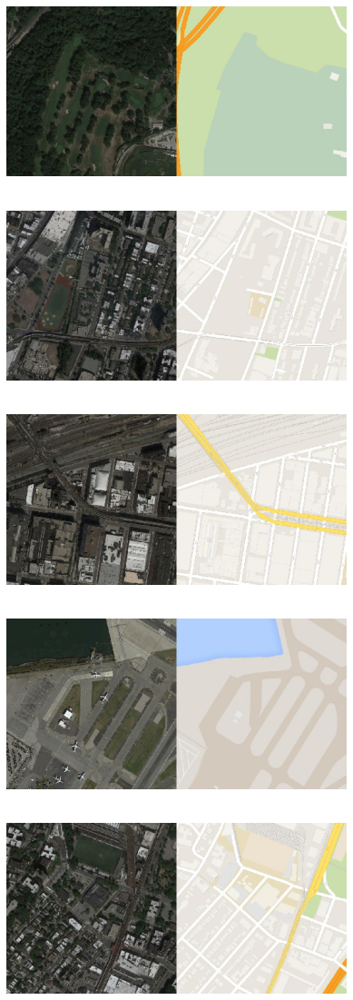

In [21]:
fig = plt.figure(figsize=(10, 20))
for i in range(5):
  plt.subplot(5, 1, i+1)
  plt.axis('off')
  plt.imshow(train_data[i].astype('uint8'))
plt.show()

In [22]:
data = normalize_images(train_data)

In [23]:
A, B = divide_images(data)

In [24]:
A.shape, B.shape

((1096, 256, 256, 3), (1096, 256, 256, 3))

0.001447504764655605 [9.13477611541748, 0.2209804654121399, 0.0891379565000534]


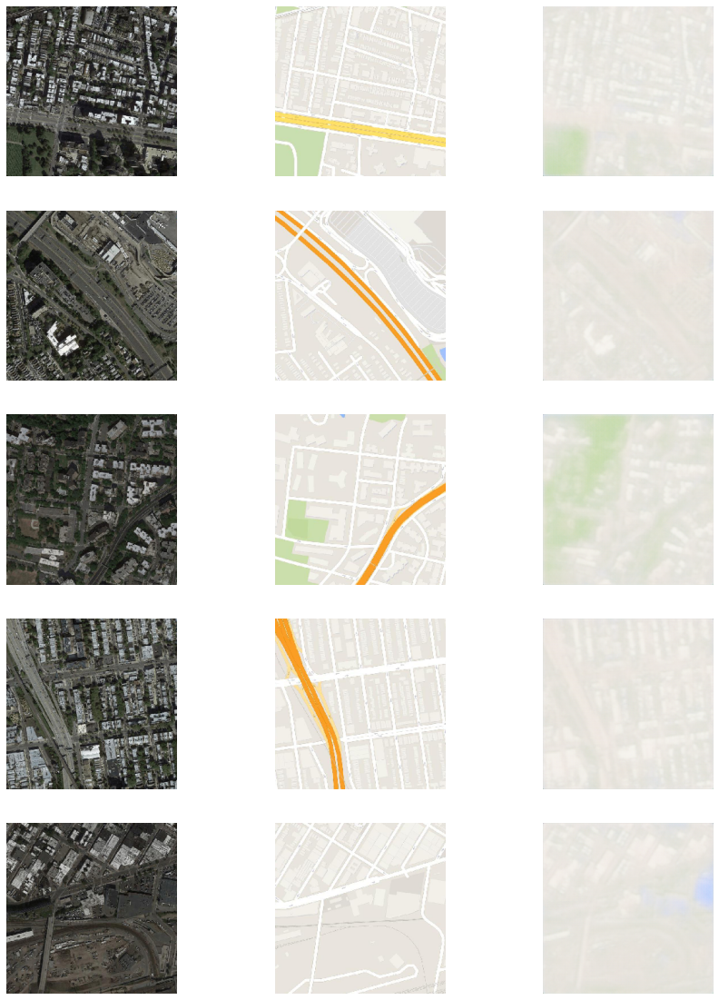

0.0028424662305042148 [8.716248512268066, 0.286320298910141, 0.08429927378892899]


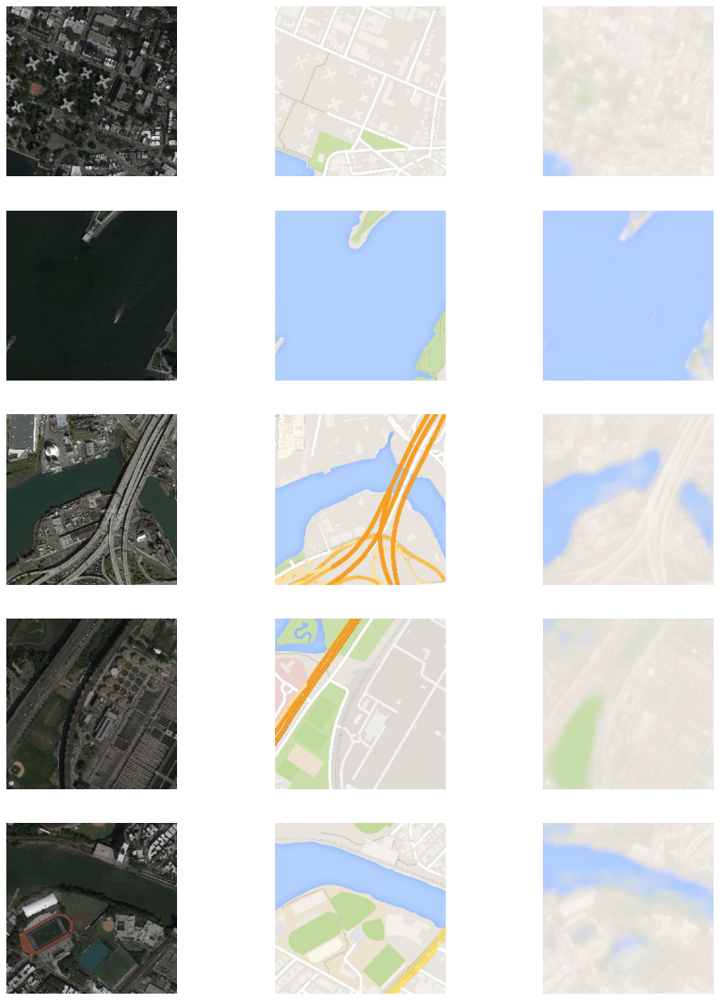

0.00027476103423396125 [8.01934814453125, 0.1972617357969284, 0.07822086662054062]


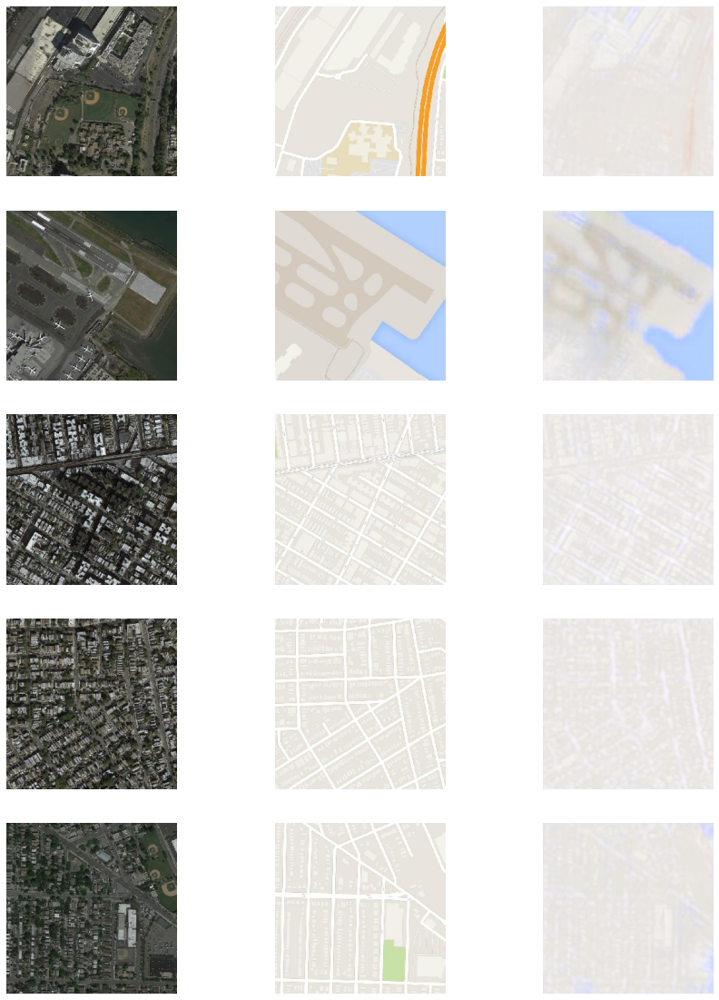

0.002138079493306577 [6.292174339294434, 0.24893976747989655, 0.06043234467506409]


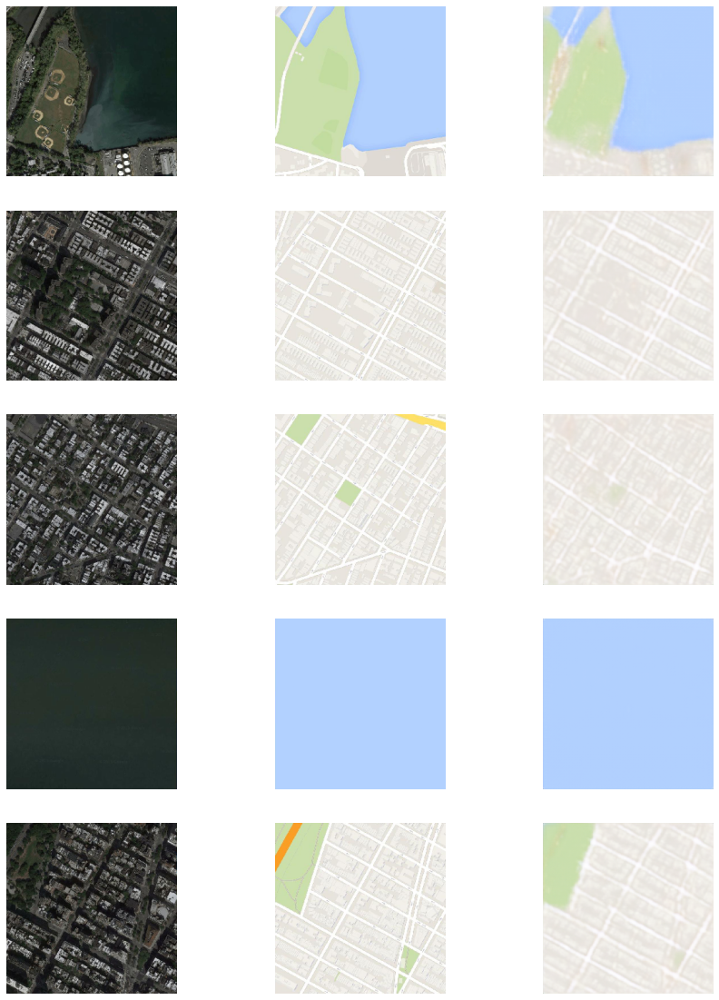

0.25565744936466217 [5.570295810699463, 0.7303815484046936, 0.04839914292097092]


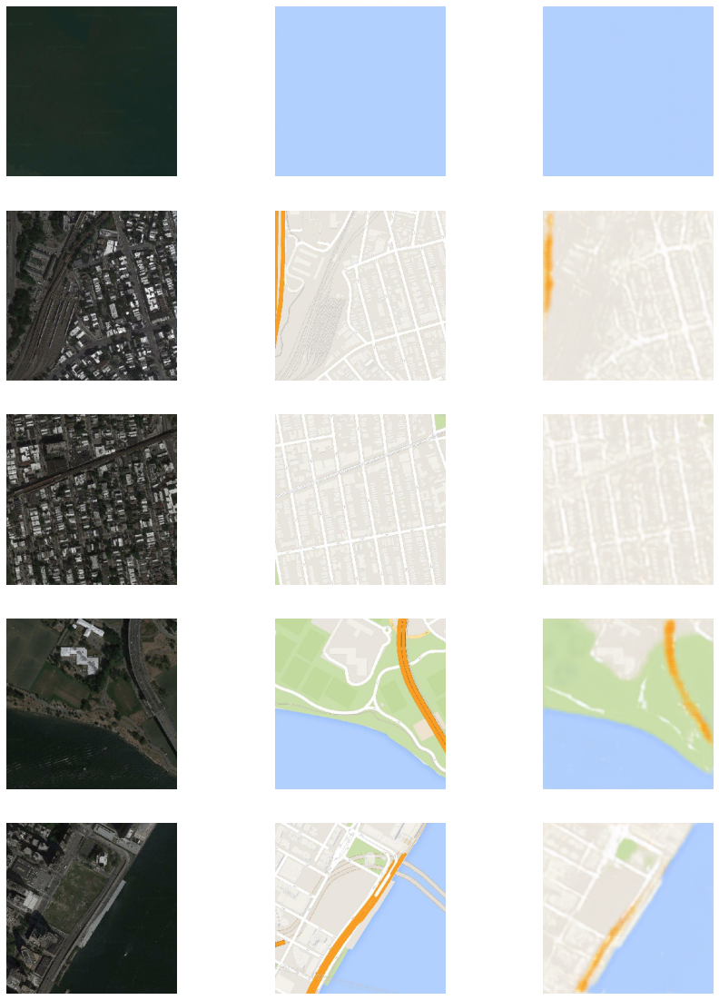

0.0016343682655133307 [5.8845534324646, 0.4146745502948761, 0.05469878762960434]


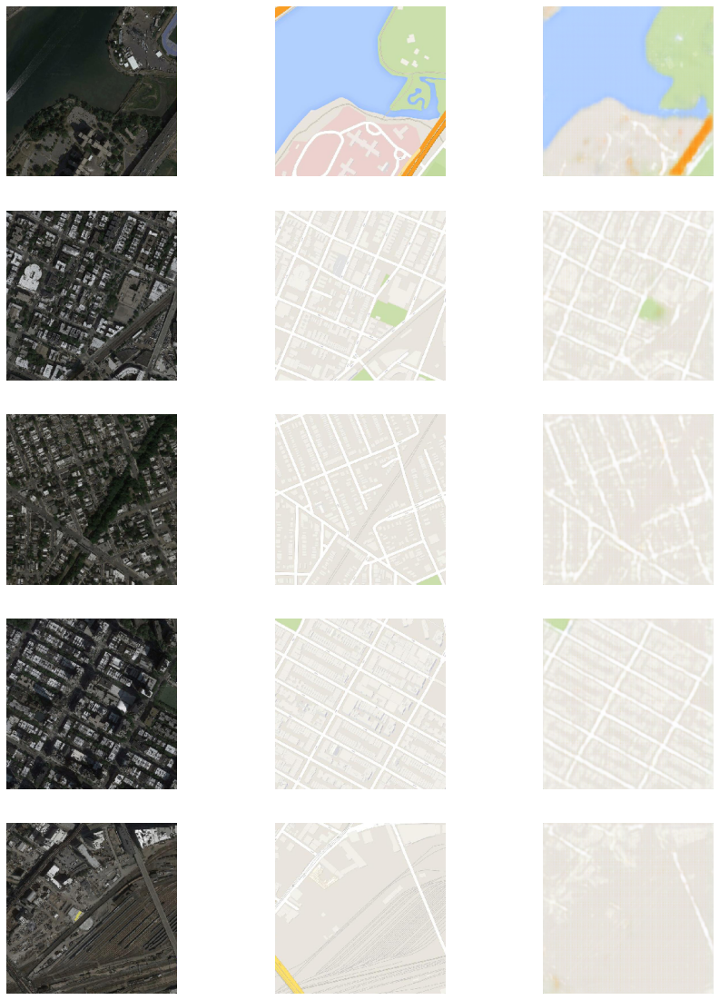

0.00020028591097798198 [5.050899982452393, 0.22746089100837708, 0.04823439195752144]


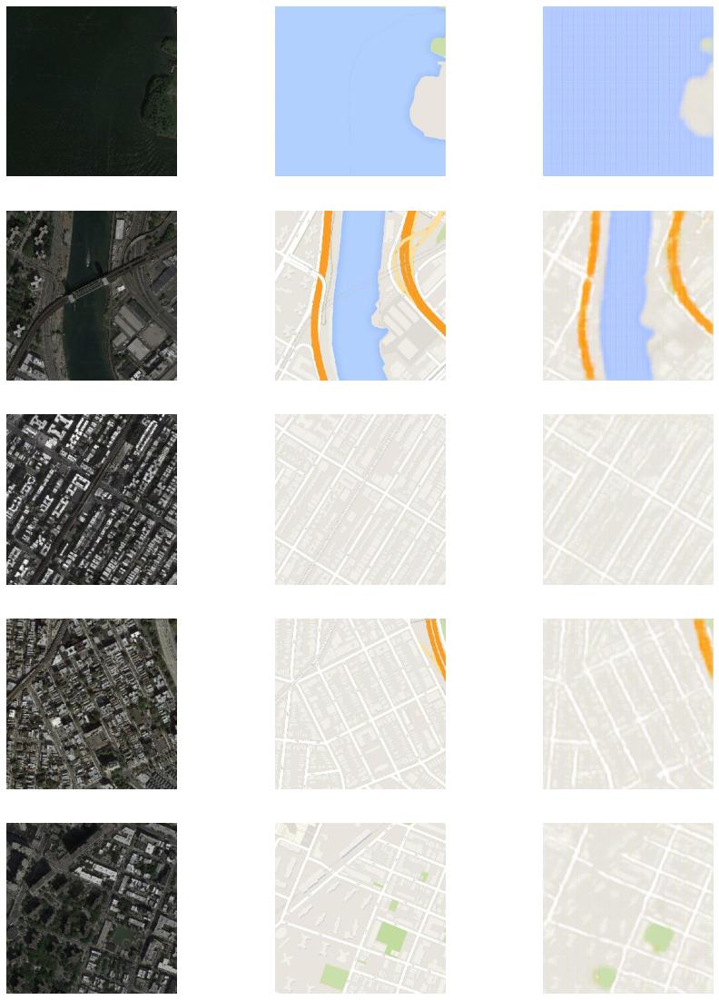

0.0029230352956801653 [4.645695209503174, 0.40101954340934753, 0.04244675487279892]


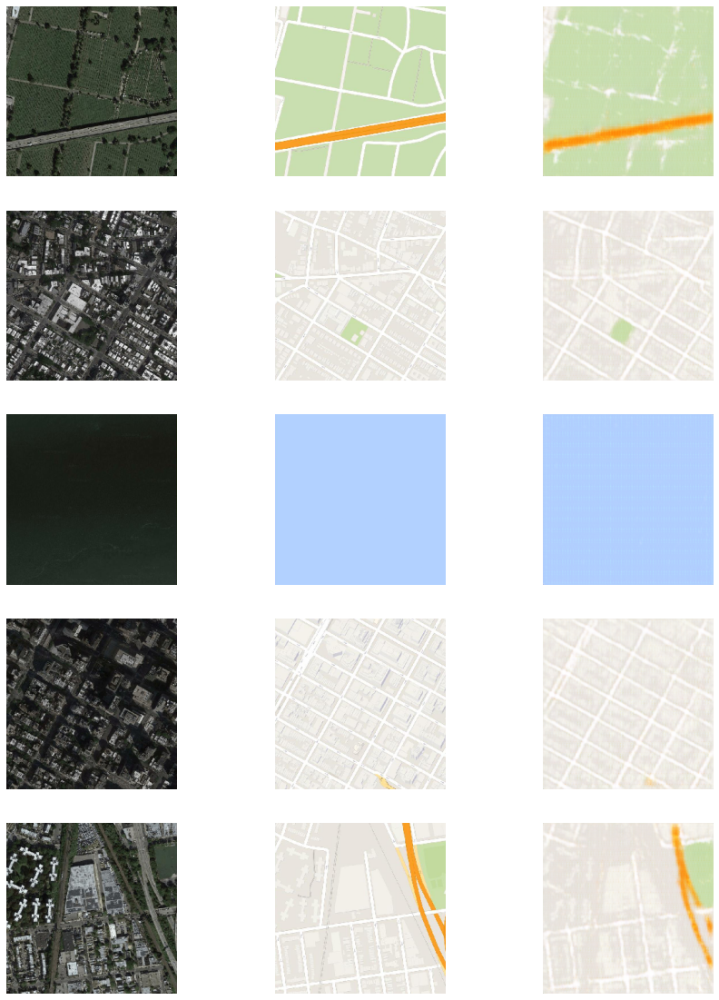

0.000207039229280781 [4.466550350189209, 0.14207087457180023, 0.04324479401111603]


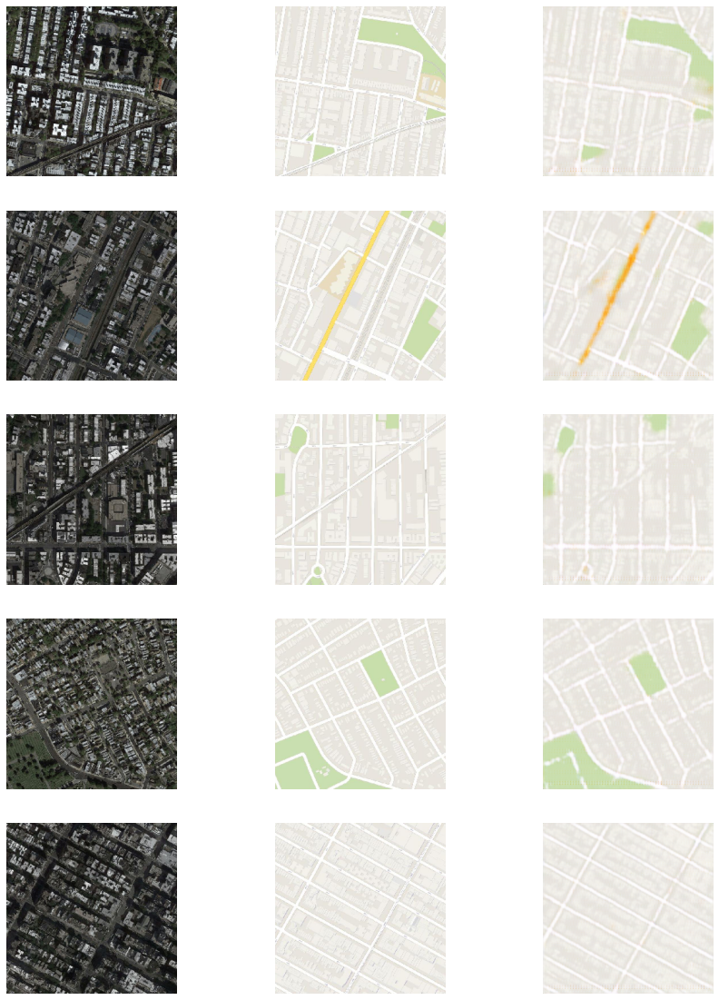

0.00013103320452501066 [4.708086013793945, 0.3192596733570099, 0.043888263404369354]


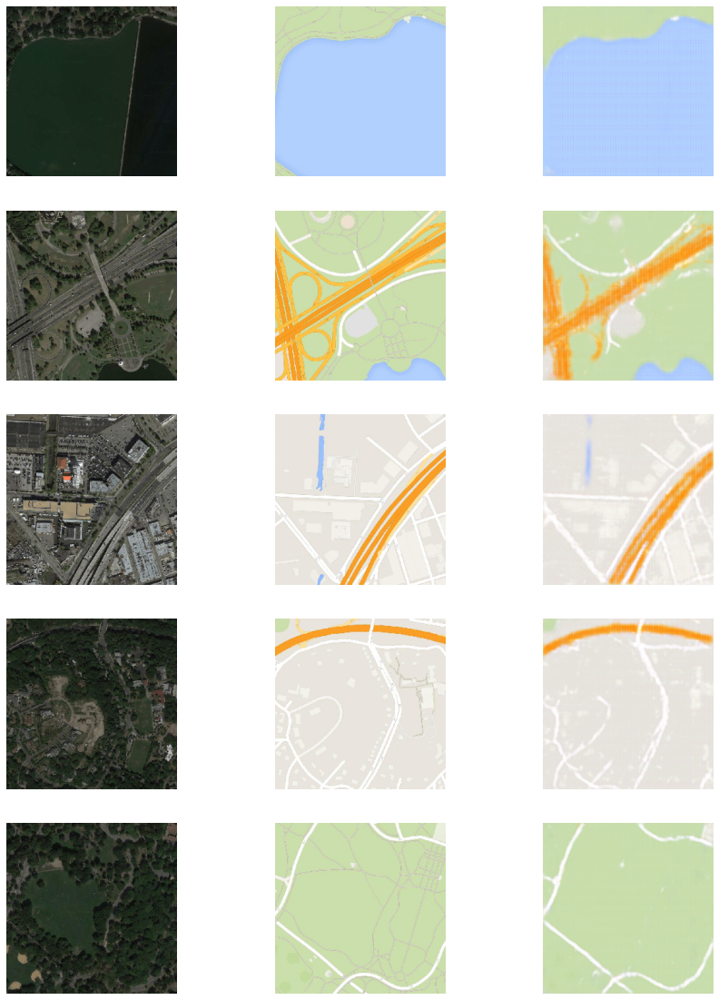

In [25]:
d_model = make_discriminator_model()
g_model = make_generator_model()
gan_model = make_gan_model(g_model, d_model)

train(gan_model, g_model, d_model, (A, B))